In [11]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from IPython.display import Image
import os

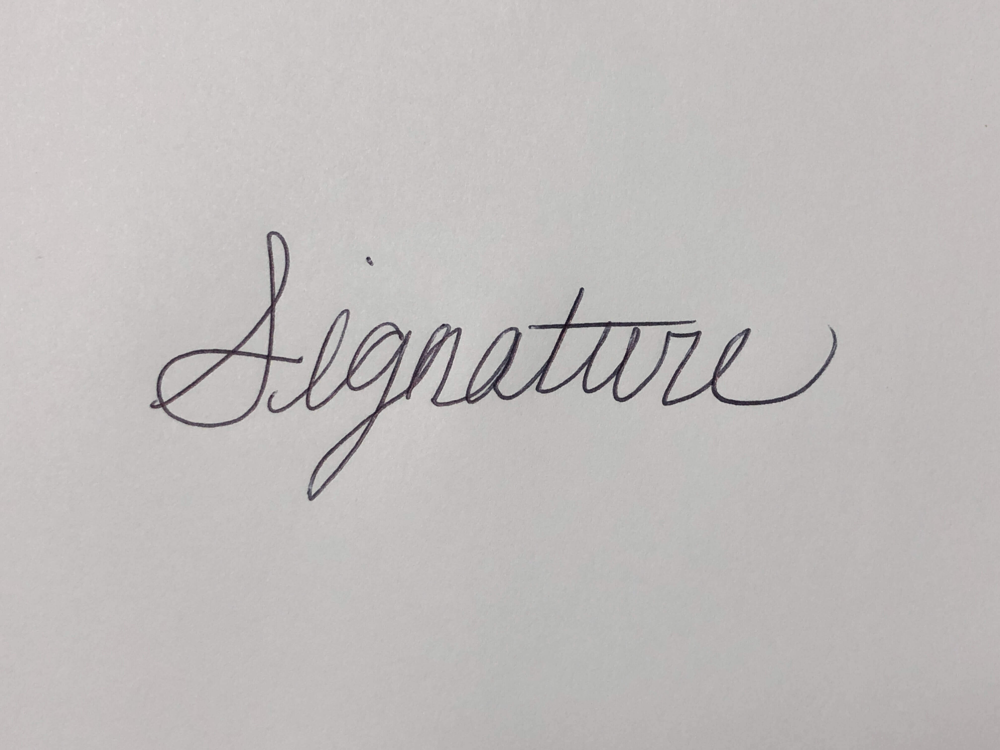

In [13]:
path = "../examples/Applications/signature.jpg"
sig_org = cv2.imread(path)
Image(path, width=300)

In [14]:
# convert to grayscale
sig_gray = cv2.cvtColor(sig_org, cv2.COLOR_BGR2GRAY)

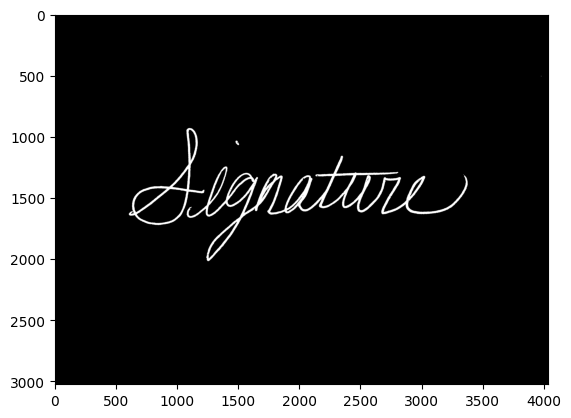

In [16]:
# Create Mask
_, mask = cv2.threshold(sig_gray, 150, 255, cv2.THRESH_BINARY_INV)
plt.imshow(mask, cmap='gray')

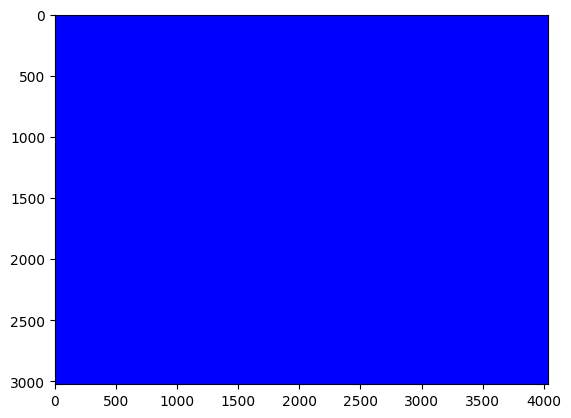

In [18]:
blue_mask = sig_org.copy()
blue_mask[:,:] = (255,0,0)
plt.imshow(blue_mask[:,:,::-1])

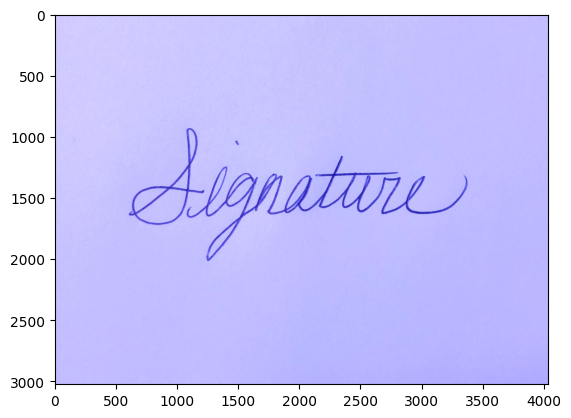

In [19]:
sig_color = cv2.addWeighted(sig_org, 1, blue_mask, 0.5, 0)
plt.imshow(sig_color[:,:,::-1])

In [20]:
# Split the color channels from the color image.
b, g, r = cv2.split(sig_color)
print(b.shape)
print(g.shape)
print(r.shape)

(3024, 4032)
(3024, 4032)
(3024, 4032)


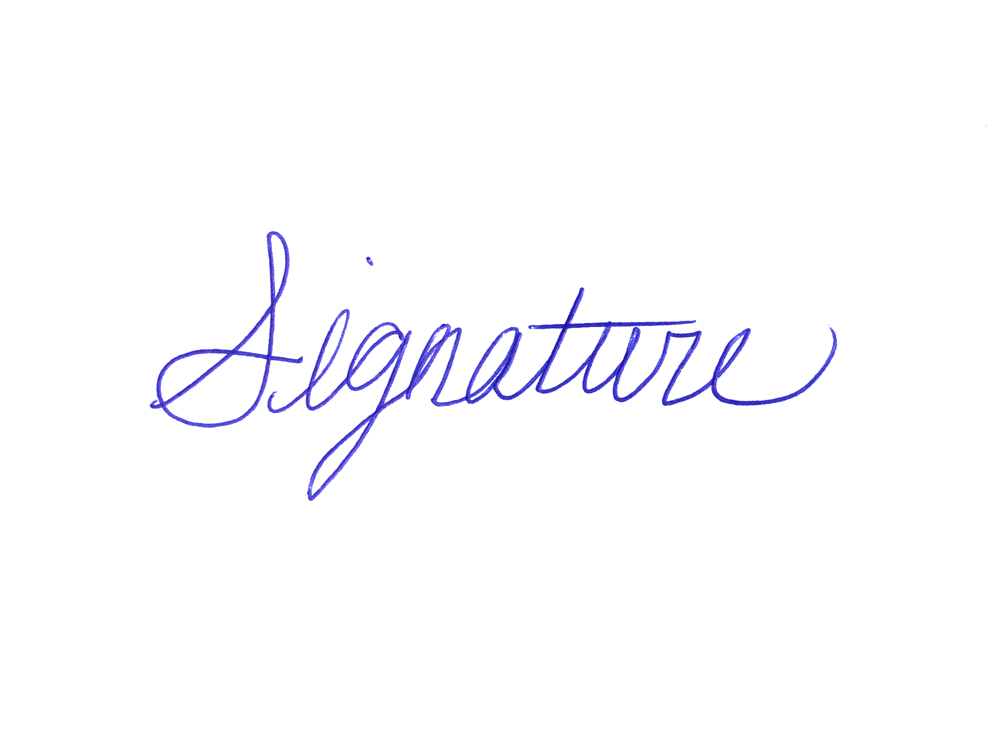

In [22]:
# Create a list of the four arrays with the alpha channel as the 4th member. These are four separate 2D arrays.
new = [b, g, r, mask]

# Use the merge() function to create a single, multi-channel array.
png = cv2.merge(new, 4)

# Save the transparent signature a PNG file to retain the alpha channel.
cv2.imwrite('extracted_sig.png', png)

# Display the actual image in the browser.
Image('extracted_sig.png', width = '400')